In [69]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)  

In [70]:
df = pd.read_csv('https://raw.githubusercontent.com/elvanselvano/purwadhika-final-project/main/dataset/DC_Properties_original.csv?token=APN5YCYQ22DRAIOHAOK7HZDA6MAIY', index_col=0)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (18,19,20,21,22,23,24,33,34,35,37,43,45) have mixed types.Specify dtype option on import or set low_memory=False.



In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158957 entries, 0 to 158956
Data columns (total 48 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   BATHRM              158957 non-null  int64  
 1   HF_BATHRM           158957 non-null  int64  
 2   HEAT                158957 non-null  object 
 3   AC                  158957 non-null  object 
 4   NUM_UNITS           106696 non-null  float64
 5   ROOMS               158957 non-null  int64  
 6   BEDRM               158957 non-null  int64  
 7   AYB                 158686 non-null  float64
 8   YR_RMDL             80928 non-null   float64
 9   EYB                 158957 non-null  int64  
 10  STORIES             106652 non-null  float64
 11  SALEDATE            132187 non-null  object 
 12  PRICE               98216 non-null   float64
 13  QUALIFIED           158957 non-null  object 
 14  SALE_NUM            158957 non-null  int64  
 15  GBA                 106696 non-nul

In [72]:
#data type adjustment
df['NUM_UNITS'] = df['NUM_UNITS'].astype(pd.Int64Dtype())
df['KITCHENS'] = df['KITCHENS'].astype(pd.Int64Dtype())
df['USECODE'] = df['USECODE'].astype(pd.Int64Dtype()).astype('category')
df['ZIPCODE'] = df['ZIPCODE'].astype(pd.Int64Dtype()).astype('category')
df['CMPLX_NUM'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['CENSUS_TRACT'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['SALEDATE'] = pd.to_datetime(df['SALEDATE'])

In [73]:
sns.set_theme()
import plotly.io as pio
pio.renderers.default = 'colab'

## **PRICE**

### Price by Year

In [114]:
df['SALEYEAR'] = df['SALEDATE'].dt.year

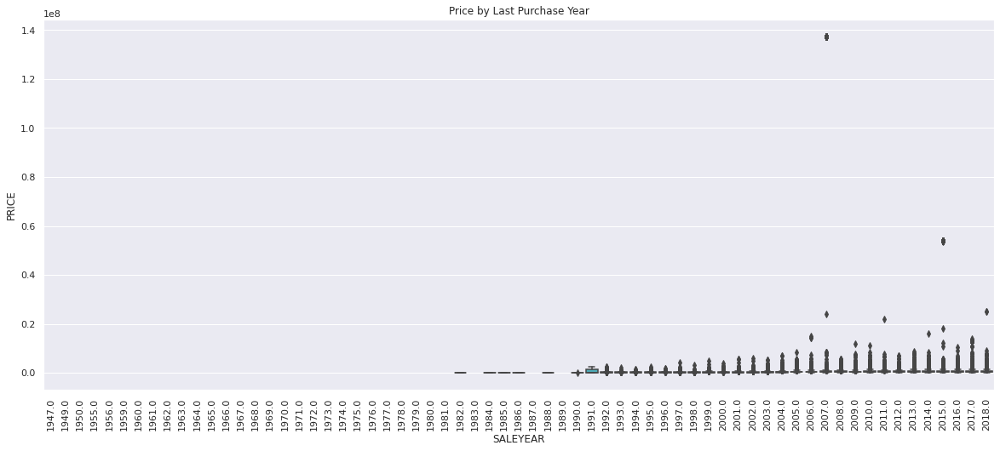

In [120]:
plt.figure(figsize=(20,8))
sns.boxplot(x=df['SALEYEAR'],y=df['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xticks(rotation=90)
plt.show()

Since the data of the price is updated based on the recent purchase. We might consider to subset the data until more recent years (2010 onward)

In [117]:
df_2010 = df[df['SALEYEAR']>=2010]

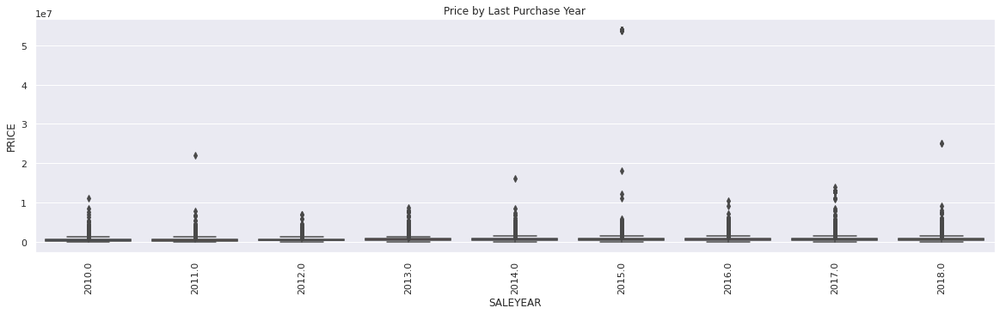

In [121]:
plt.figure(figsize=(20,5))
sns.boxplot(x=df_2010['SALEYEAR'],y=df_2010['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xticks(rotation=90)
plt.show()

There are some outlier data that can obstruct visualization and mislead our next step

In [123]:
q1 = df_2010['PRICE'].quantile(0.25)
q3 = df_2010['PRICE'].quantile(0.75)

iqr = q3-q1
low_whisker = q1 - 1.5*iqr
upp_whisker = q3 + 1.5*iqr

print(low_whisker)
print(upp_whisker)

-300850.0
1381150.0


In [124]:
new_df = df_2010[df_2010['PRICE']< upp_whisker] #remove outlier

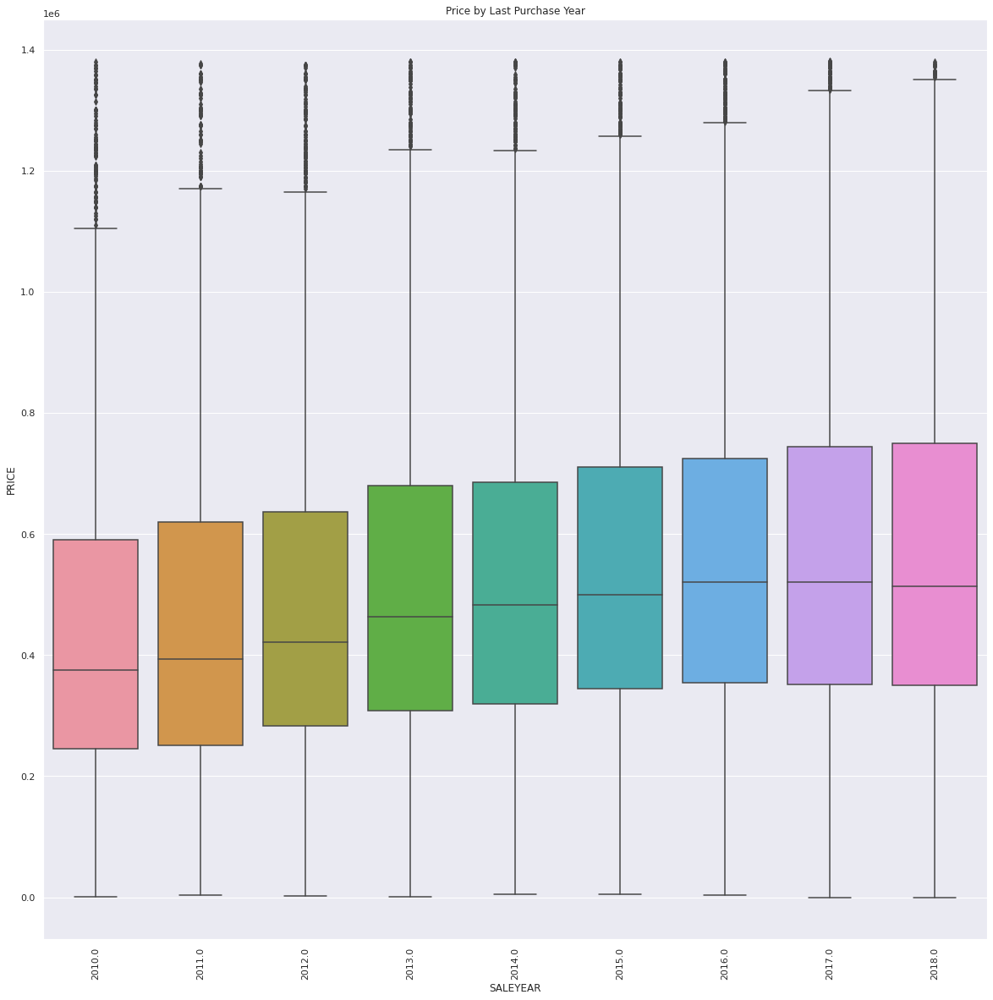

In [248]:
sns.set_palette(sns.color_palette("Set2")
plt.figure(figsize=(20,5))
sns.boxplot(x=new_df['SALEYEAR'],y=new_df['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xticks(rotation=90)
plt.show()

### Price Distribution

In [133]:
price = new_df['PRICE']

fig = px.histogram(x=price, nbins=20, labels={'value': 'Price', 'count': 'number of properties'},
                   marginal='box', title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=10,r=10,t=40,b=10))

fig.show()

Based on the graph above, the price data is left-skewed. While most of properties in DC is around 300-400k USD, the maximum price is on the far-right at around 1.2M-1.3M. It is also important to note that the properties below 100k USD is rare meaning that buying properties in DC seems to be a struggle

## **LOCATION**

### Distribution by Region

In [165]:
quadrant = new_df[~new_df['QUADRANT'].isna()]
fig = px.scatter_mapbox(quadrant, lat='LATITUDE', lon='LONGITUDE', color='QUADRANT', hover_data=['QUADRANT', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=0.1,
                        title='Distribution of Properties by Quadrant')
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [148]:
fig = px.scatter_mapbox(new_df, lat='LATITUDE', lon='LONGITUDE', color='WARD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=0.1,
                        title='Distribution of Properties by Wards')
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

### House Style in Each Region

In [247]:
df.PRICE.quantile(0.1)

130000.0

In [163]:
style = new_df[~new_df['STYLE'].isna()].copy() #remove missing data style
fig = px.scatter_mapbox(style, lat='LATITUDE', lon='LONGITUDE', color='STYLE', hover_data=['STYLE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=0.5,
                        title='House Style Mapping')
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

Most of the residential in DC is dominated by 2 Story House. Besides,in the NorthWest (Ward 1,2,3,4), the number of 2.5 Story is quite high, while in the Ward 7, 1 Story residential is also common.

Regional Price Distribution

In [179]:
new_df['PRICE'].describe()

count    5.255900e+04
mean     5.285544e+05
std      2.783948e+05
min      1.000000e+00
25%      3.200000e+05
50%      4.770000e+05
75%      6.999990e+05
max      1.381000e+06
Name: PRICE, dtype: float64

In [193]:
price_cat_df = new_df.copy()
label = ['<100k','100-200k','200-300k','300-400k','400-500k','500-600k','600-700k','700-800k','800-900k','900k-1M','1-1.1M','1.1-1.2M','1.2-1.3M','1.3-1.4M']
price_cat_df['PRICE_CAT'] = pd.cut(new_df['PRICE'],bins=[i*100000 for i in range(15)],labels=label)

In [202]:
fig = px.scatter_mapbox(price_cat_df, lat='LATITUDE', lon='LONGITUDE', color='PRICE_CAT', hover_data=['PRICE_CAT', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=0.3,
                        title='House Style Mapping')
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

/usr/local/lib/python3.7/dist-packages/plotly/express/_core.py:286: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



The map above indicate the price of residential located in Ward 3 and Ward 4 seems to be higher than the other Wards

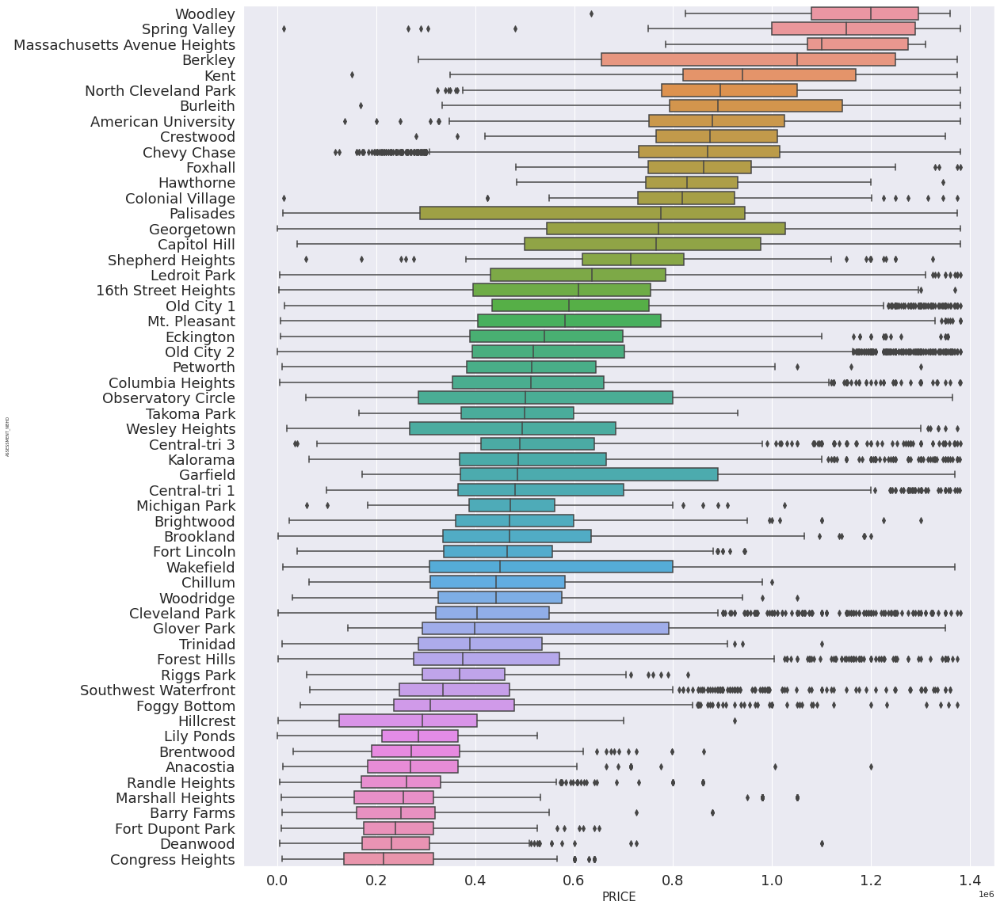

In [235]:
fig=plt.figure(figsize=(17,20))

table = new_df.groupby(['ASSESSMENT_NBHD'],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)

sns.boxplot(data=new_df,x='PRICE',y='ASSESSMENT_NBHD',order=table['ASSESSMENT_NBHD'].to_list());
plt.yticks(fontsize=18);
plt.xticks(fontsize=18);
plt.ylabel("ASSESSMENT_NBHD",fontsize=5);
plt.xlabel("PRICE",fontsize=15);

The Wood

## **PROPERTIES FEATURE**

In [203]:
feat = new_df[['HEAT','AC','FIREPLACES','PRICE']].copy().dropna()

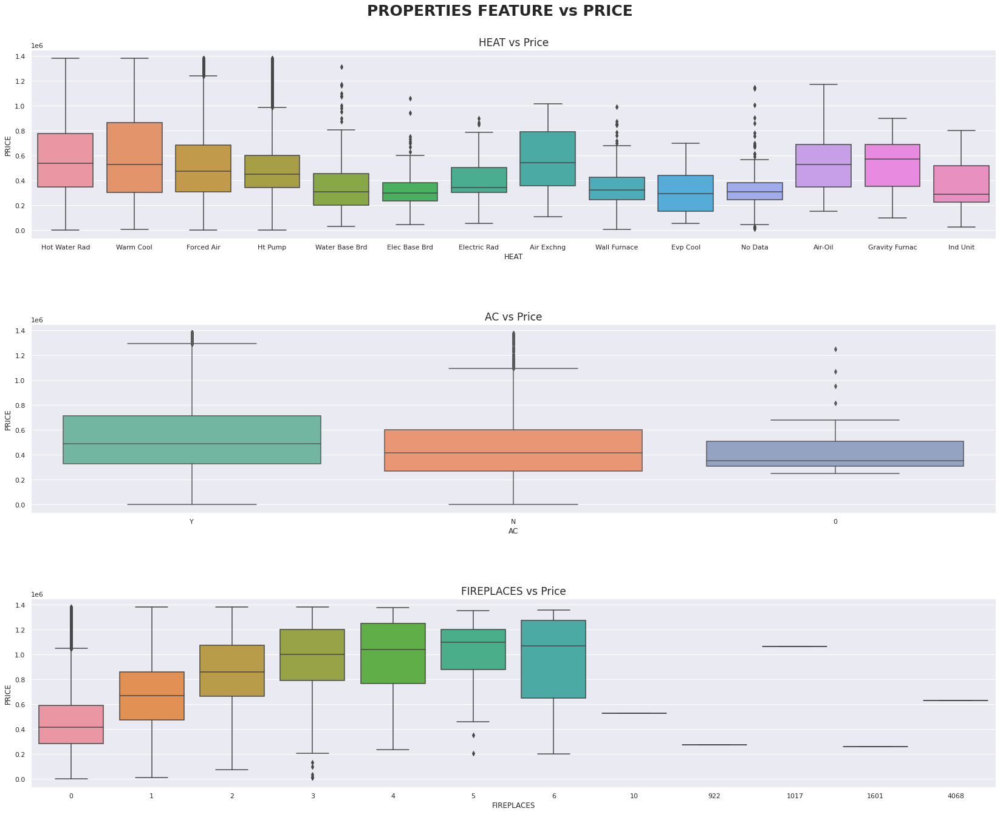

In [204]:
fig, ax = plt.subplots(3,1,figsize=(25,20))
sns.boxplot(x='HEAT',y='PRICE',data=new_df,ax=ax[0]).set_title('HEAT vs Price',fontsize=17)
sns.boxplot(x='AC',y='PRICE',data=new_df,ax=ax[1]).set_title('AC vs Price',fontsize=17)
sns.boxplot(x='FIREPLACES',y='PRICE',data=new_df,ax=ax[2]).set_title('FIREPLACES vs Price',fontsize=17)
fig.suptitle('PROPERTIES FEATURE vs PRICE', fontsize=25, fontweight='bold')
fig.tight_layout(pad=7)
plt.show()

HEAT shows vague ability to predict price. It is better to drop the feature.
Meanwhile, AC and fireplaces indicates ability to divide the property prices. Besides, some outlier data also occurs and will be further processed in the next steps

## **GRADE AND CONDITION**

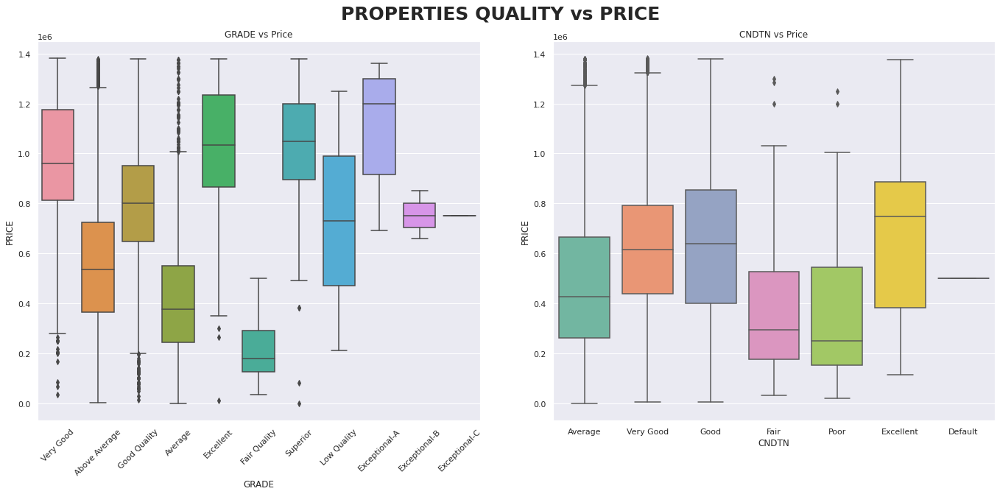

In [205]:
grc = new_df[['GRADE','CNDTN','PRICE']].copy().dropna()
fig, ax = plt.subplots(1,2,figsize=(20,10))
sns.boxplot(x='GRADE',y='PRICE',data=grc,ax=ax[0]).set_title('GRADE vs Price',fontsize=12)
ax[0].set_xticklabels(grc['GRADE'].unique(),rotation = 45)
sns.boxplot(x='CNDTN',y='PRICE',data=grc,ax=ax[1]).set_title('CNDTN vs Price',fontsize=12)
fig.suptitle('PROPERTIES QUALITY vs PRICE', fontsize=25, fontweight='bold')
fig.tight_layout(pad=4)
plt.show()

Both of the chart seems to be able to contribute to the price, since each category can distinguish the price quite well. However, the exceptional B and C in the Grade and Good, Very Good in CNDTN should be paid attention.

## **MATERIAL AND STRUCTURE**

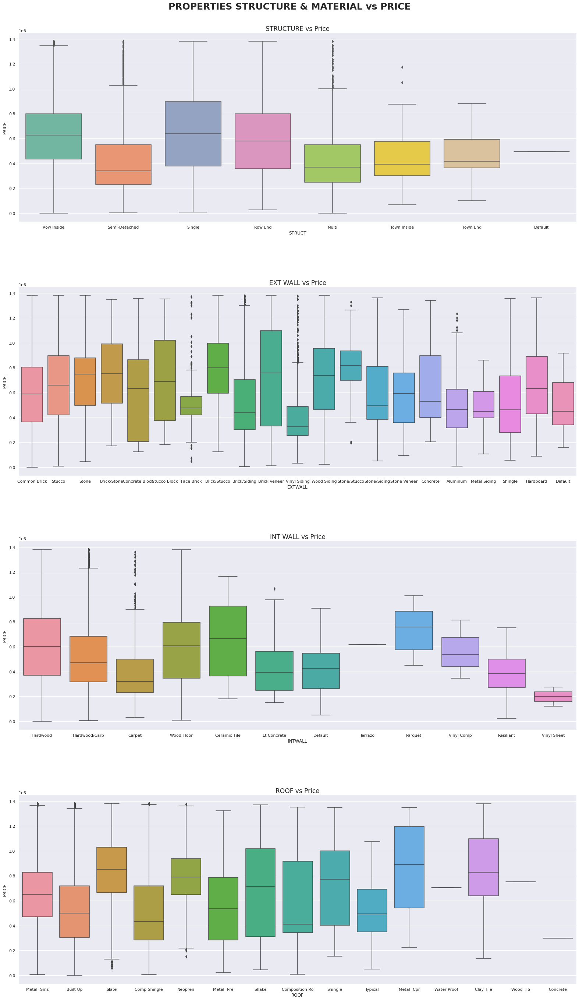

In [207]:
mas = new_df[['STRUCT','EXTWALL','INTWALL','ROOF','PRICE']].copy().dropna()
fig, ax = plt.subplots(4,1,figsize=(25,40))
sns.boxplot(x='STRUCT',y='PRICE',data=mas,ax=ax[0]).set_title('STRUCTURE vs Price',fontsize=17)
sns.boxplot(x='EXTWALL',y='PRICE',data=mas,ax=ax[1]).set_title('EXT WALL vs Price',fontsize=17)
sns.boxplot(x='INTWALL',y='PRICE',data=mas,ax=ax[2]).set_title('INT WALL vs Price',fontsize=17)
sns.boxplot(x='ROOF',y='PRICE',data=mas,ax=ax[3]).set_title('ROOF vs Price',fontsize=17)
fig.suptitle('PROPERTIES STRUCTURE & MATERIAL vs PRICE', fontsize=25, fontweight='bold')
fig.tight_layout(pad=10)
plt.show()

Since there are too many categorical values in the feature, the values could be grouped together.

## **ROOM TYPES**

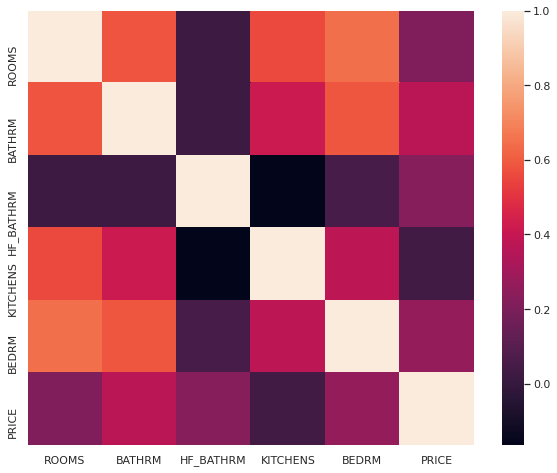

In [403]:
room_type = new_df[['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','PRICE']].copy().dropna()
plt.figure(figsize=(10,8))
sns.heatmap(room_type.corr(),cmap='rocket')
plt.show()

1. Number of bathroom indicates higher correlation to price than any other room types.
2. Some multicollinearity might occurs between :
  - Rooms vs (Bedrm, Kitchens, Bathrm)
  - Kitchen vs (Bathrm, Bedrm, Rooms)

## Missing Data

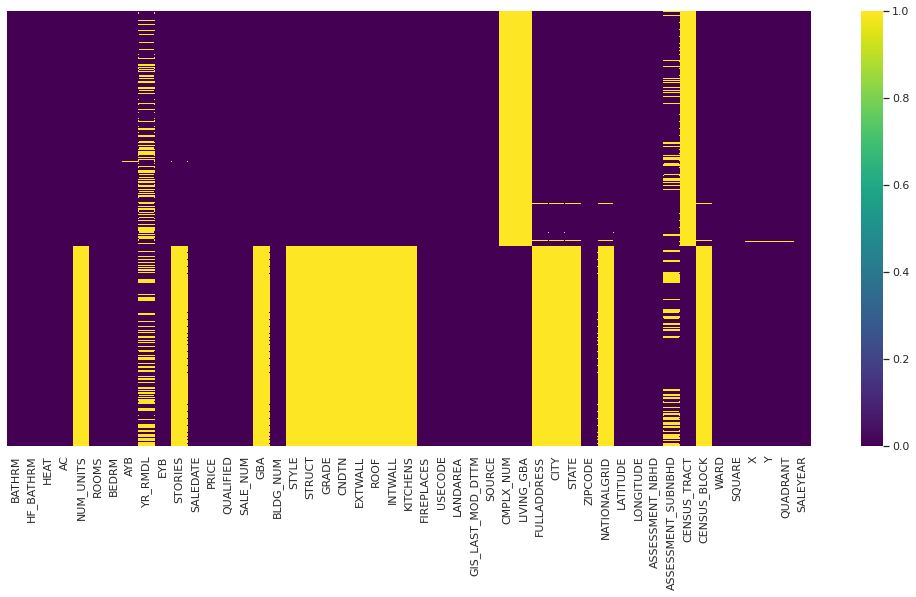

In [208]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(new_df.isnull(), yticklabels=False,cmap='viridis')
plt.show()

In [291]:
#drop ASSESSMENT_SUBNBHD, CMPLX_NUM, CENSUS_TRACT, LIVING GBA
df_clean_1 = new_df.drop(['ASSESSMENT_SUBNBHD','CMPLX_NUM','CENSUS_TRACT','LIVING_GBA'],axis=1)

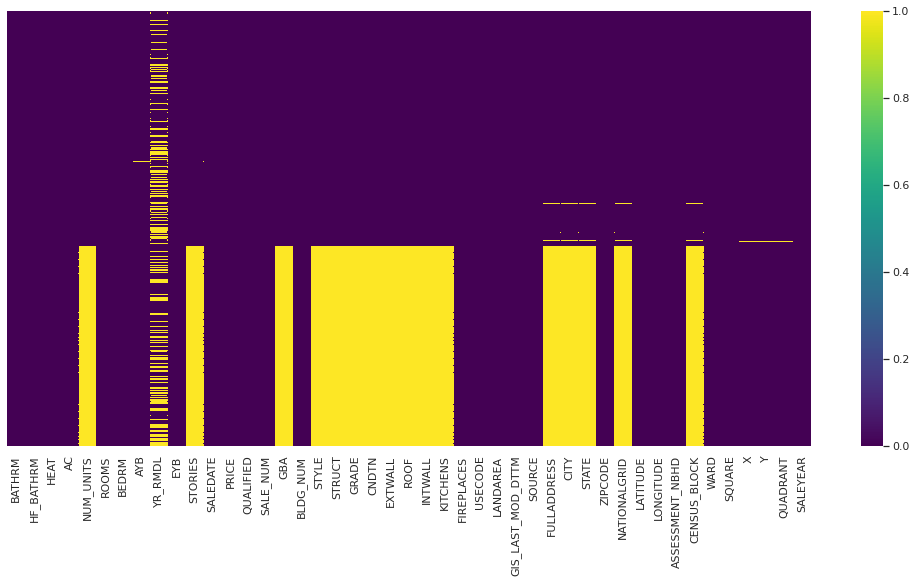

In [292]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_1.isnull(), yticklabels=False,cmap='viridis')
plt.show()

In [388]:
#drop SALEDATE(using SALEYEAR instead), FULLADDRESS, NATIONALGRID, CENSUS_BLOCK (high cardinality), CITY, STATE (1 value), BLDG_NUM, NUM_UNITS(imbalance),X,Y (similar value with LONGITUDE, LATITUDE)
df_clean_2 = df_clean_1.drop(['SALEDATE','FULLADDRESS','NATIONALGRID','CENSUS_BLOCK','CITY','STATE','BLDG_NUM','NUM_UNITS','X','Y'],axis=1)

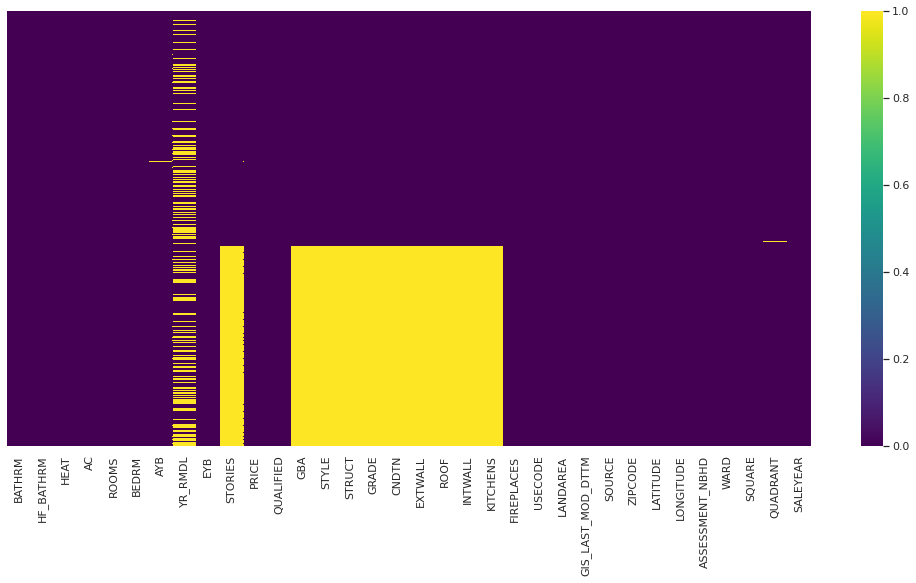

In [389]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_2.isnull(), yticklabels=False,cmap='viridis')
plt.show()

The YR_RMDL seems too important to drop. Intuitively, if the properties have been remodeled, it could affect the price. We try to do feature enginering by replacing the year with the boolean value whether the properties have ever been remodeled or not.

In [305]:
df_clean_3 = df_clean_2.copy()

In [306]:
df_clean_3['RMDL'] = np.where(df_clean_2['YR_RMDL'].isna(),0,1)
df_clean_3 = df_clean_3.drop('YR_RMDL',axis=1)

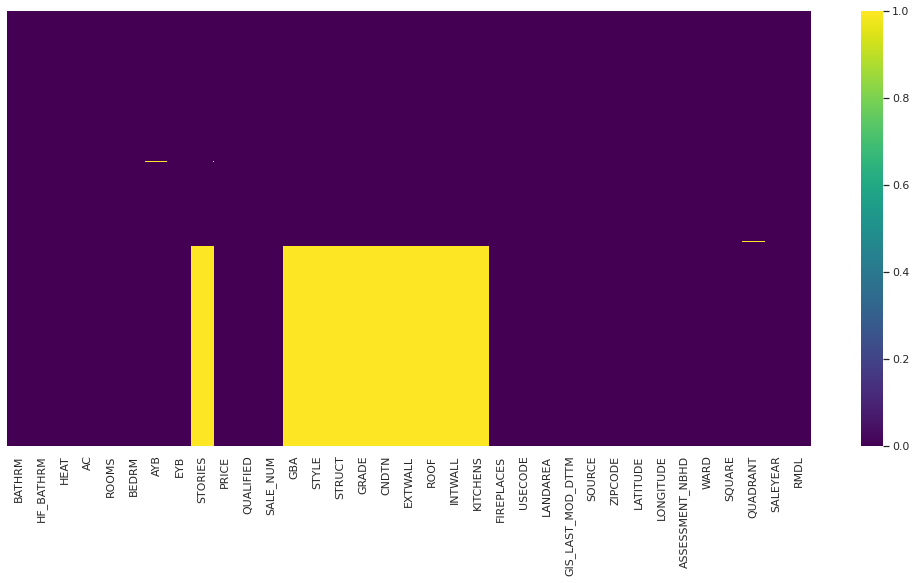

In [307]:
df_fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_3.isnull(), yticklabels=False,cmap='viridis')
plt.show()

Location is indicated by too many features

In [308]:
df_clean_4 = df_clean_3.drop(['ZIPCODE','LONGITUDE','LATITUDE','ASSESSMENT_NBHD','SQUARE','QUADRANT'],axis=1)

Some feature not related to the properties (update version date and source data)

In [312]:
df_clean_5 = df_clean_4.drop(['GIS_LAST_MOD_DTTM','SOURCE'],axis=1)

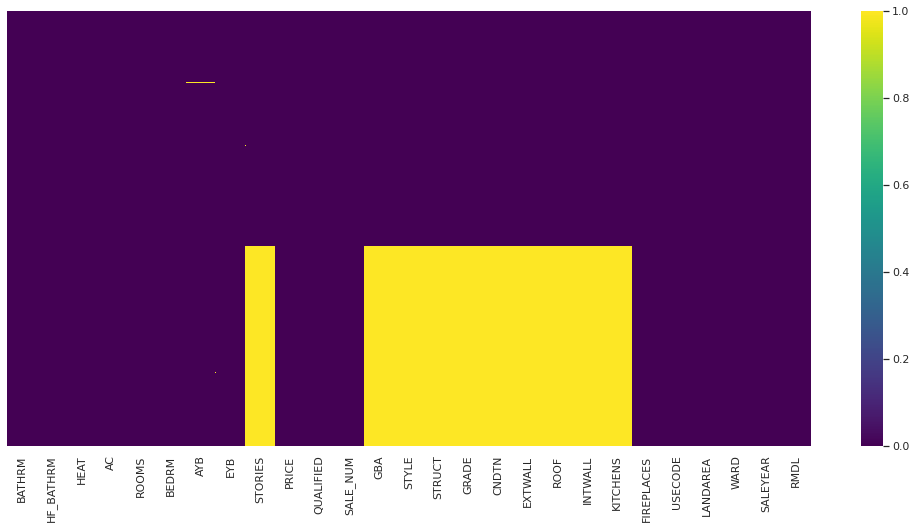

In [313]:
df_fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_5.isnull(), yticklabels=False,cmap='viridis')
plt.show()

Stories represent similar value with Style. Since Stories has many outlier values, we choose Style instead

In [364]:
df_clean_6 = df_clean_5.drop('STORIES',axis=1)

Qualified indicating whether the price represent market value according to the office's internal criteria. We are using only qualified price.

In [365]:
df_clean_7 = df_clean_6[df_clean_6['QUALIFIED']=='Q']

In [367]:
df_clean_7 = df_clean_7.drop('QUALIFIED',axis=1)

In [368]:
df_clean_8 = df_clean_7.dropna()

CORRELATION

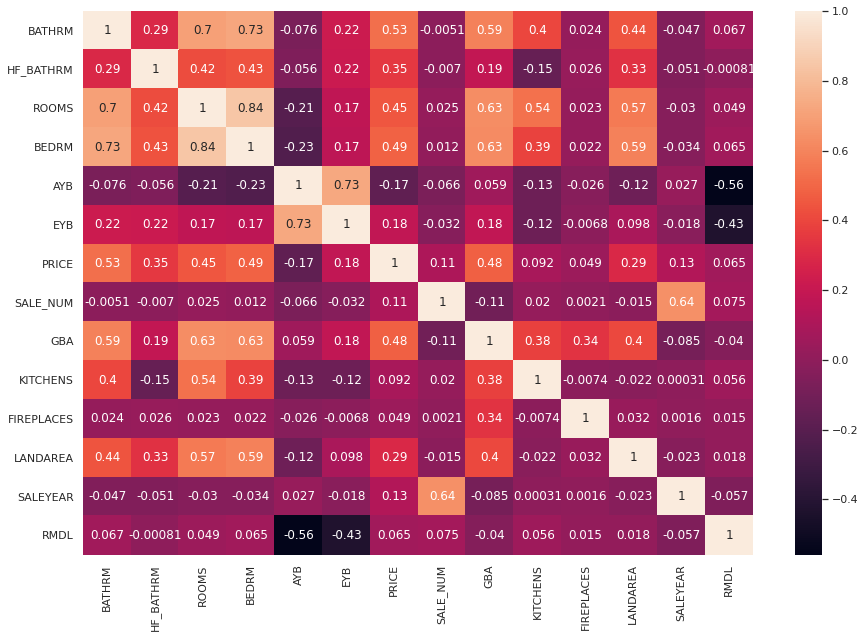

In [369]:
plt.figure(figsize=(15,10))
sns.heatmap(df_clean_7.corr(),annot=True)

Drop rooms 

In [390]:
df_clean_9 = df_clean_8.drop(['ROOMS','SALE_NUM'],axis=1)

## **Feature Engineering**

Convert AC Values to 1 0

In [391]:
df_clean_9.AC.value_counts()

Y    19305
N     4062
0        7
Name: AC, dtype: int64

In [392]:
df_clean_9['AC'] = np.where(df_clean_9['AC']=='Y',1,0)

In [393]:
df_clean_9.AC.value_counts()

1    19305
0     4069
Name: AC, dtype: int64

Ordinal Encoding CNDTN

In [377]:
!pip install category_encoders

     |████████████████████████████████| 81kB 3.3MB/s 


In [380]:
import category_encoders as ce

In [404]:
ordinal_mapping = [{'col':'CNDTN','mapping':{'Poor':1,'Fair':2,'Average':3,'Good':4,'Very Good':5,'Excellent':6}}]
ordinal_encoder = ce.OrdinalEncoder(cols ='CNDTN',mapping = ordinal_mapping) 
df_clean_10 = ordinal_encoder.fit_transform(df_clean_9)                                                

In [395]:
df_clean_10.head()

,BATHRM,HF_BATHRM,HEAT,AC,BEDRM,AYB,EYB,PRICE,SALE_NUM,GBA,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,WARD,SALEYEAR,RMDL
7,3,1,Hot Water Rad,1,4,1906.0,1972,1050000.0,1,2401.0,3 Story,Row Inside,Very Good,3,Common Brick,Metal- Sms,Hardwood,2,1,24,1627,Ward 2,2011.0,1
14,3,1,Warm Cool,1,3,1917.0,1967,1325000.0,1,2692.0,2 Story,Row Inside,Above Average,5,Stucco,Metal- Sms,Hardwood,2,1,24,1815,Ward 2,2011.0,1
16,3,1,Warm Cool,1,3,1908.0,1967,1240000.0,1,1662.0,2 Story,Row Inside,Above Average,5,Common Brick,Metal- Sms,Hardwood,1,0,11,1424,Ward 2,2010.0,1
23,2,1,Forced Air,1,3,1880.0,1984,1065000.0,1,1600.0,2 Story,Semi-Detached,Above Average,5,Common Brick,Built Up,Hardwood,1,1,13,2090,Ward 2,2012.0,1
24,2,1,Hot Water Rad,1,3,1880.0,1967,1100000.0,1,1958.0,2 Story,Single,Above Average,4,Common Brick,Built Up,Hardwood,1,2,12,2090,Ward 2,2012.0,1


In [394]:
from google.colab import files
df_clean_9.to_csv('df_clean_10.csv',index=False)
files.download('df_clean_10.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Train Test Split

In [398]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=2021)

In [397]:
X = df_clean_10.drop('PRICE',axis=1)
y = df_clean_10['PRICE']

In [399]:
train_clean = pd.concat([X_train, y_train],axis=1)
test_clean = pd.concat([X_test, y_test],axis=1)

In [400]:
train_clean

,BATHRM,HF_BATHRM,HEAT,AC,BEDRM,AYB,EYB,SALE_NUM,GBA,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,WARD,SALEYEAR,RMDL,PRICE
83879,2,1,Forced Air,1,3,1928.0,1964,1,1176.0,2 Story,Single,Average,4,Vinyl Siding,Comp Shingle,Hardwood,1,0,12,3750,Ward 7,2011.0,1,215000.0
68919,3,1,Forced Air,1,4,2014.0,2015,3,1640.0,2 Story,Semi-Detached,Good Quality,5,Vinyl Siding,Metal- Sms,Hardwood,1,0,13,2961,Ward 4,2015.0,0,640000.0
16967,2,1,Hot Water Rad,1,3,1900.0,1967,3,1116.0,2 Story,Row Inside,Above Average,4,Common Brick,Metal- Sms,Hardwood,1,0,11,730,Ward 6,2014.0,1,652000.0
58693,3,1,Forced Air,1,4,1923.0,1972,3,1875.0,2 Story,Single,Above Average,4,Wood Siding,Comp Shingle,Hardwood,1,1,12,5000,Ward 4,2018.0,1,825000.0
92514,3,1,Forced Air,1,4,2012.0,2014,1,1616.0,2 Story,Row Inside,Above Average,5,Vinyl Siding,Comp Shingle,Hardwood/Carp,1,0,11,2000,Ward 7,2012.0,0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101874,2,0,Warm Cool,1,3,1939.0,1964,1,890.0,2 Story,Row Inside,Average,4,Common Brick,Built Up,Hardwood/Carp,1,0,11,1600,Ward 8,2012.0,1,133000.0
89573,1,1,Forced Air,1,3,1953.0,1971,4,1188.0,2 Story,Row End,Average,4,Common Brick,Built Up,Hardwood,1,0,11,3278,Ward 7,2015.0,1,311575.0
11299,3,1,Forced Air,1,4,1900.0,1963,1,1776.0,2 Story,Row End,Good Quality,4,Common Brick,Neopren,Hardwood,2,2,24,1750,Ward 6,2012.0,1,780000.0
78494,3,1,Forced Air,1,3,2013.0,2015,4,1680.0,2 Story,Row Inside,Good Quality,5,Face Brick,Comp Shingle,Hardwood/Carp,1,0,11,1520,Ward 5,2017.0,0,543000.0


In [401]:
train_clean.to_csv('train_clean.csv',index=False)
files.download('train_clean.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [402]:
test_clean.to_csv('test_clean.csv',index=False)
files.download('test_clean.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>